In [1]:
import pandas as pd
import numpy as np
import sys
import os
import time
import random
import copy
import math
import scanpy as sc
%matplotlib inline
from matplotlib import pyplot as plt
import matplotlib as mpl
import scanpy.external as sce
import seaborn as sns
import autoreload
params = {
    'font.size': 12,
    'axes.titlesize': 12,
    'axes.labelsize': 12,
    'legend.fontsize': 12,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'font.family': "Helvetica",
    'pdf.fonttype': 42,
    'ps.fonttype': 42,
    'figure.dpi': 300
   }

mpl.rcParams.update(params)

sns.set_style("ticks")

savefig_args = {"dpi": 300, "bbox_inches": "tight", "pad_inches": 0, "transparent": True}
mpl.rc('savefig', dpi=300)
output_dir = "outs"
output_suffix = ""
output_formats = [".png", ".pdf"]

def save_figure(fig, name, output_dir=output_dir, output_suffix=output_suffix, output_formats=output_formats, savefig_args=savefig_args):
    for output_format in output_formats:
        fig.savefig(output_dir + "/" + name + output_suffix + output_format, **savefig_args)
    return None

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

data_dir = "../data/"
#import auto reload
%load_ext autoreload
%autoreload 2


/home/mswift/local/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


In [2]:
sc.set_figure_params(dpi = 100, frameon=False)

/home/mswift/local/anaconda3/envs/singlecell/lib/python3.6/site-packages/anndata/compat/__init__.py:161: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  FutureWarning,
/home/mswift/local/anaconda3/envs/singlecell/lib/python3.6/site-packages/anndata/compat/__init__.py:161: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  FutureWarning,


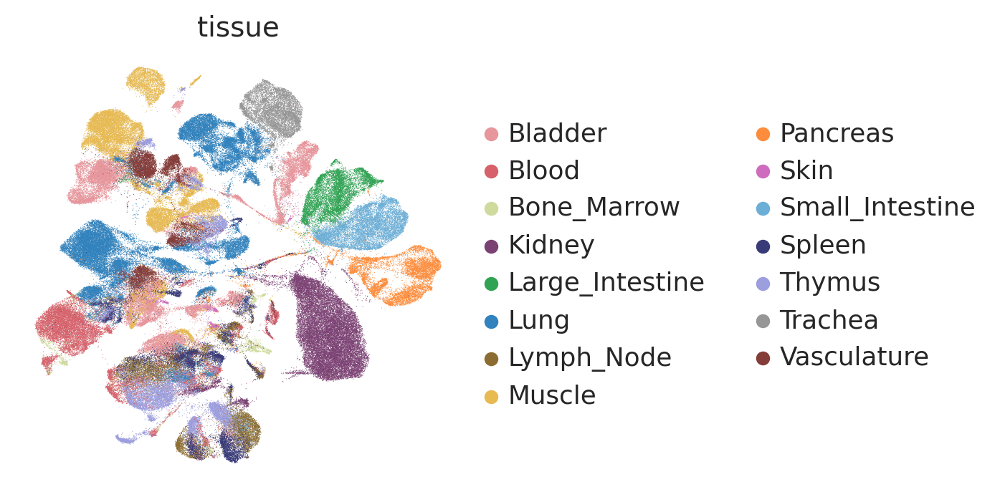

In [17]:
adata = sc.read_h5ad('../data/Pilot1_Pilot2.Final.h5ad')
del adata.raw
adata.var[adata.var.index == 'IGHM']

sc.pl.umap(adata, color=['tissue'])


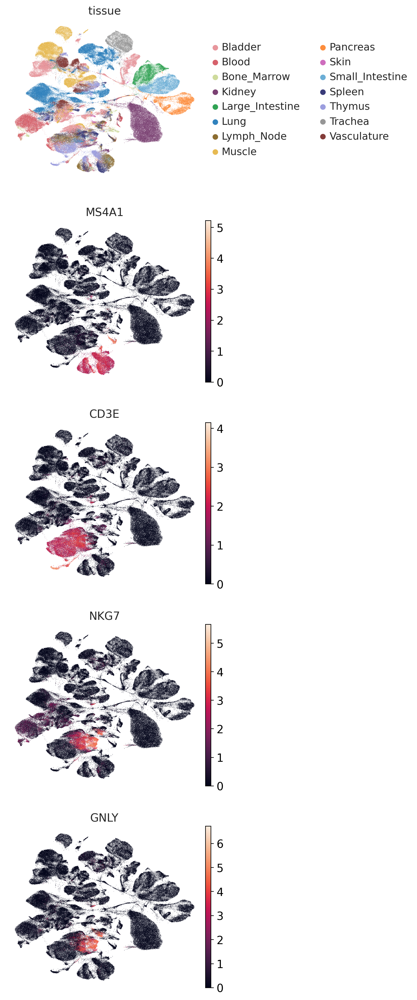

In [22]:
sc.pl.umap(adata, color=['tissue', 'MS4A1', 'CD3E', 'NKG7', 'GNLY'], ncols=1)

In [8]:
adataB = adata[adata.obs.propagated_cell_ontology_class.str.contains('B cell|plasma cell'),:]

In [4]:
adataT = adata[adata.obs.propagated_cell_ontology_class.str.contains('T cell'),:]

In [8]:
sc.pp.neighbors(adataT)

sc.tl.umap(adataT)

sc.tl.leiden(adataT, resolution = 0.3)

/home/mswift/local/anaconda3/envs/singlecell/lib/python3.6/site-packages/scanpy/neighbors/__init__.py:121: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['distances'] = neighbors.distances
/home/mswift/local/anaconda3/envs/singlecell/lib/python3.6/site-packages/scanpy/neighbors/__init__.py:122: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'] = neighbors.connectivities
/home/mswift/local/anaconda3/envs/singlecell/lib/python3.6/site-packages/scanpy/tools/_umap.py:147: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'].tocoo()

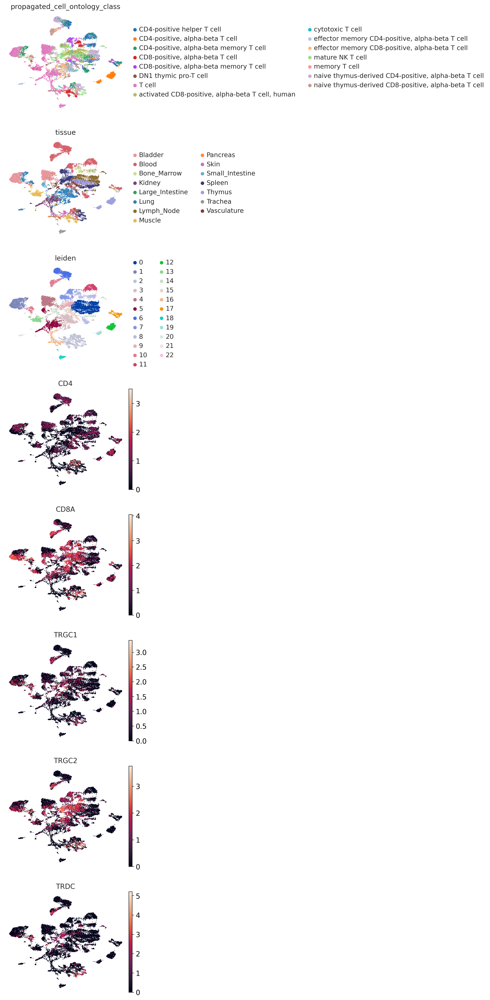

In [23]:
sc.pl.umap(adataT, color=['propagated_cell_ontology_class', 
                          'tissue', 'leiden', 'CD4', 'CD8A', 'TRGC1', 'TRGC2', 'TRDC'], ncols=1)

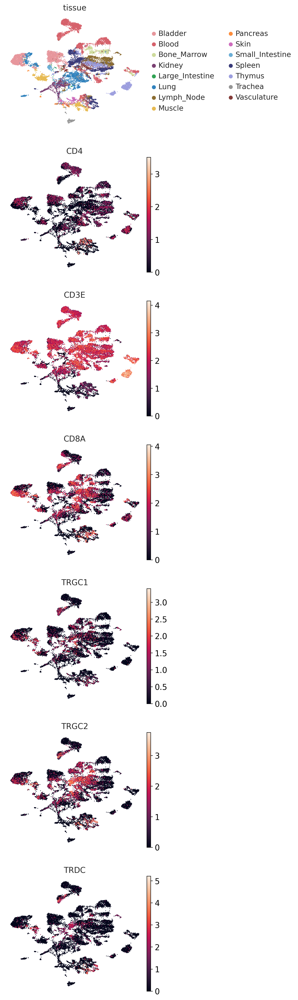

In [25]:
sc.pl.umap(adataT, color=[ 'tissue', 'CD4', 'CD3E', 'CD8A', 'TRGC1', 'TRGC2', 'TRDC'], ncols=1)

In [15]:
sc.tl.rank_genes_groups(adataT, groupby='tissue')

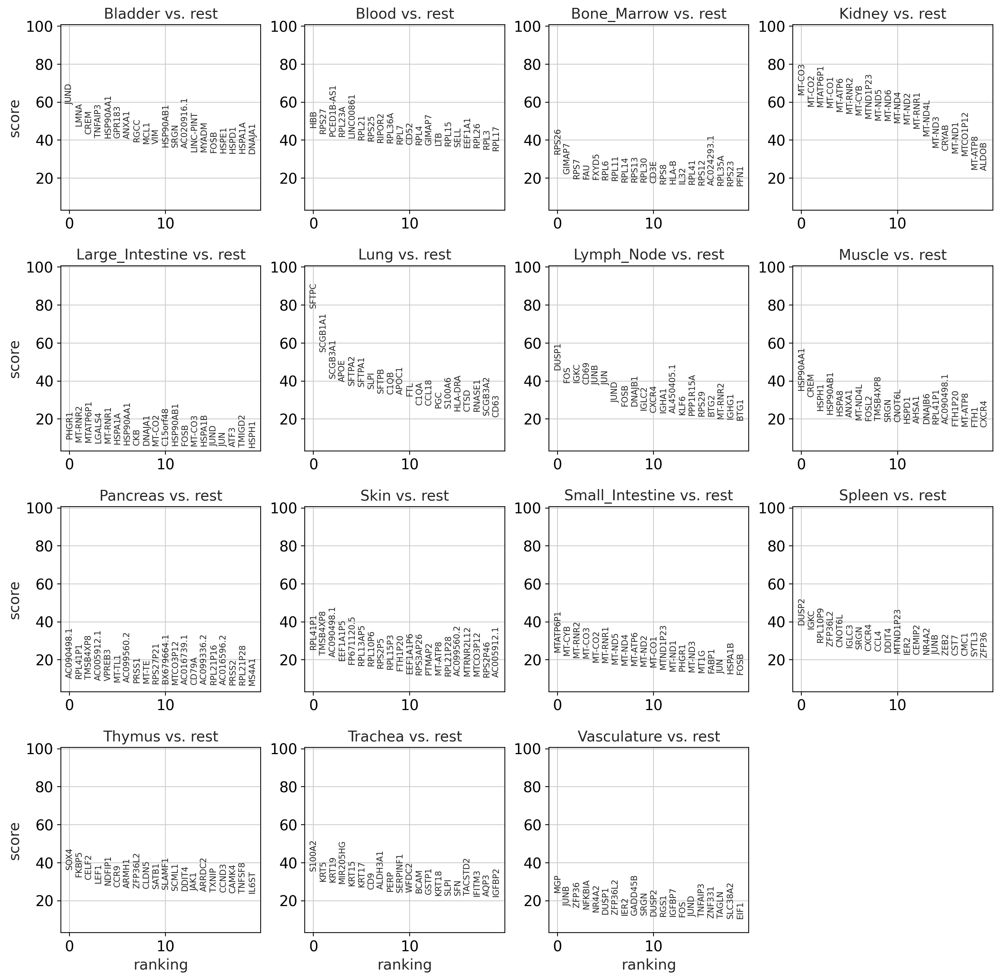

In [16]:
sc.pl.rank_genes_groups(adataT)

sc.pl.umap(adataB, color=['propagated_cell_ontology_class', 'leiden', 
                          'tissue'], ncols=1)

sc.pl.umap(adataT, color=['propagated_cell_ontology_class', 'leiden', 
                          'tissue','IGHD', 'IGHM', "DUSP1", 'CD27', 'CD38', 'MS4A1', 'SDC1'])


In [10]:
_df = adata.obs[adata.obs['donor'] == 'TSP2']

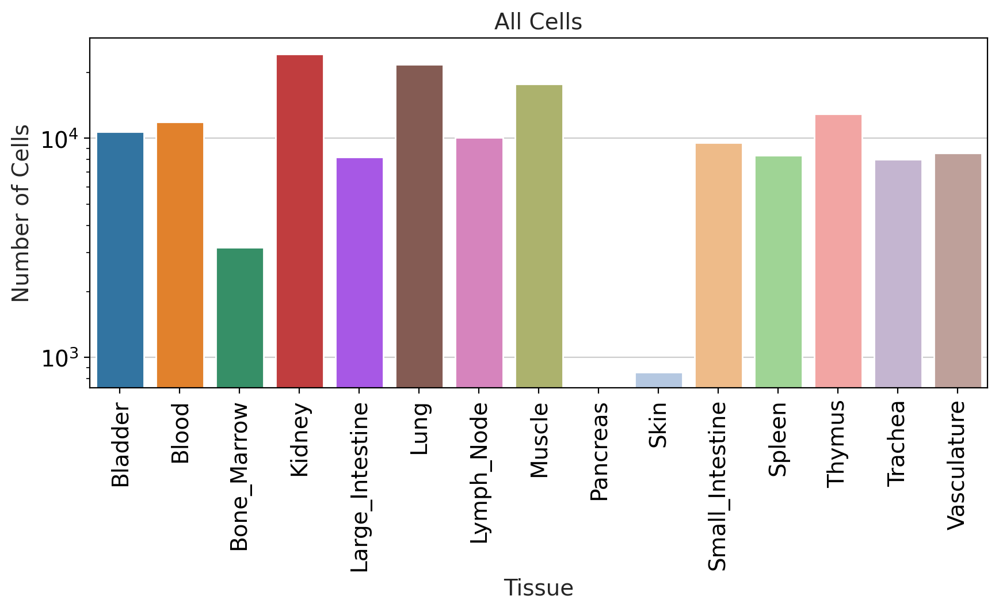

In [11]:
data = _df.tissue.value_counts().reset_index()
fig, ax = plt.subplots(1,1, figsize = (10,4))
sns.barplot(data = data, x = 'index', y = 'tissue')
plt.title('All Cells')
plt.xlabel('Tissue')
plt.ylabel('Number of Cells')
plt.xticks(rotation = 90)
plt.yscale('log')

In [13]:
# How many T cells
_dfT = _df[_df.propagated_cell_ontology_class.str.contains('T cell')]

In [14]:
# How many B cells
_dfB = _df[_df.propagated_cell_ontology_class.str.contains('B cell|plasma cell')]

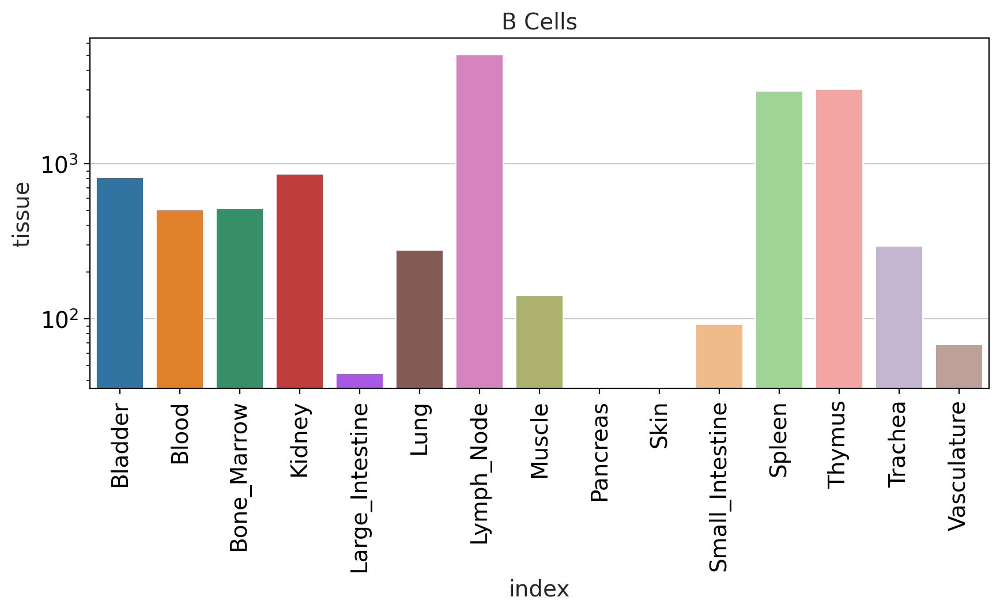

In [17]:
data = _dfB.tissue.value_counts().reset_index()
fig, ax = plt.subplots(1,1, figsize = (10,4))
plt.title('B Cells')
plt.xlabel('Tissue')
plt.ylabel('Number of Cells')
plt.xticks(rotation = 90)
plt.yscale('log')
sns.barplot(data = data, x = 'index', y = 'tissue')

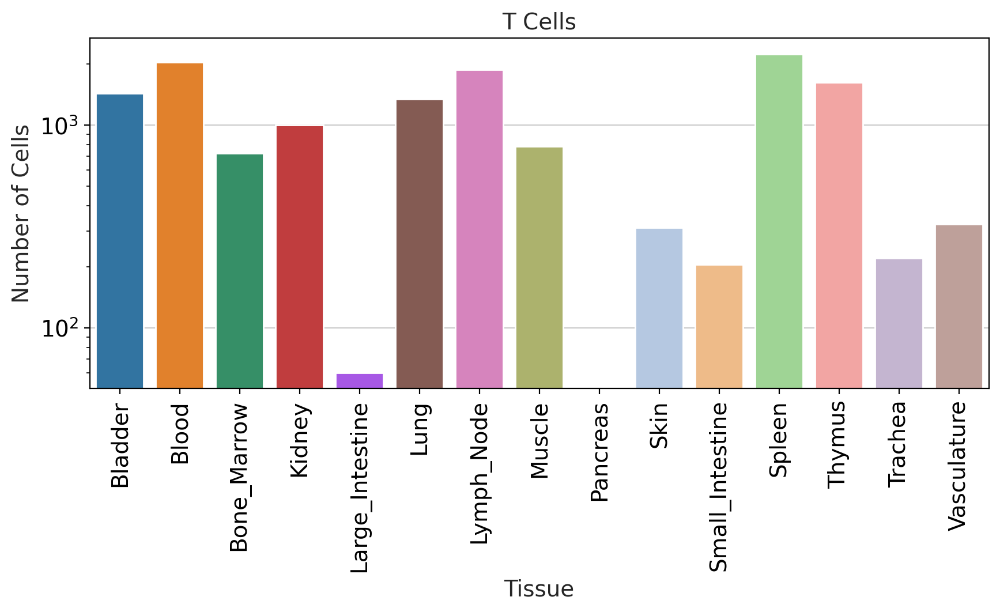

In [18]:
data = _dfT.tissue.value_counts().reset_index()
fig, ax = plt.subplots(1,1, figsize = (10,4))
sns.barplot(data = data, x = 'index', y = 'tissue')
plt.title('T Cells')
plt.xlabel('Tissue')
plt.ylabel('Number of Cells')
plt.xticks(rotation = 90)
plt.yscale('log')


In [32]:
adataT.obs[adataT.obs.method == 'smartseq2']

,10X_run,smartseq2_barcode,smartseq2_library_plate,smartseq2_sorting_direction,smartseq2_sort_order,smartseq2_cDNA_Plate,cell_id,method,notes,donor,smartseq2_sorted_population,10X_replicate,10X_sample,sequencer,sex,anatomical_position,tissue,smartseq2_well_seq,10X_barcode,n_counts,n_genes,batch,donor_tech_tissue,donor_tech,compartment,compartment_pred,propagated_cell_ontology_class,manual_cell_ontology_class,propagated_cell_ontology_class_0,manual_cell_ontology_class_0,leiden
B107809_A10-1-0,nan,BC5,B107809Blue,Column,Plate 3,B107809,B107809_A10_S130.homo.gencode.v30.ERCC.chrM,smartseq2,nan,TSP1,Epithelial,nan,nan,novaseq,female,MedialDistal,Lung,A10,nan,11980.0,433,1,TSP1_smartseq2_Lung,TSP1_smartseq2,unassigned,Immune,"CD4-positive, alpha-beta memory T cell",unassigned,plasma cell,unassigned,16
B107809_A17-1-0,nan,BC5,B107809Blue,Column,Plate 3,B107809,B107809_A17_S137.homo.gencode.v30.ERCC.chrM,smartseq2,nan,TSP1,Endothelial,nan,nan,novaseq,female,MedialDistal,Lung,A17,nan,146534.0,740,1,TSP1_smartseq2_Lung,TSP1_smartseq2,unassigned,Endothelial,"CD4-positive, alpha-beta memory T cell",unassigned,capillary endothelial cell,unassigned,16
B107809_B8-1-0,nan,BC5,B107809Blue,Column,Plate 3,B107809,B107809_B8_S151.homo.gencode.v30.ERCC.chrM,smartseq2,nan,TSP1,Epithelial,nan,nan,novaseq,female,MedialDistal,Lung,B8,nan,158926.0,1148,1,TSP1_smartseq2_Lung,TSP1_smartseq2,unassigned,Endothelial,"CD4-positive, alpha-beta memory T cell",unassigned,capillary endothelial cell,unassigned,16
B107809_E8-1-0,nan,BC5,B107809Blue,Column,Plate 3,B107809,B107809_E8_S220.homo.gencode.v30.ERCC.chrM,smartseq2,nan,TSP1,Epithelial,nan,nan,novaseq,female,MedialDistal,Lung,E8,nan,232308.0,633,1,TSP1_smartseq2_Lung,TSP1_smartseq2,unassigned,Endothelial,"CD4-positive, alpha-beta memory T cell",unassigned,capillary endothelial cell,unassigned,16
B107809_F5-1-0,nan,BC5,B107809Blue,Column,Plate 3,B107809,B107809_F5_S240.homo.gencode.v30.ERCC.chrM,smartseq2,nan,TSP1,Epithelial,nan,nan,novaseq,female,MedialDistal,Lung,F5,nan,54031.0,449,1,TSP1_smartseq2_Lung,TSP1_smartseq2,unassigned,Stromal,"CD4-positive, alpha-beta memory T cell",unassigned,capillary endothelial cell,unassigned,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TSP2_Trachea_NA_SS2_B113352_B133048_Epithelial_L21_S81.homo.gencode.v30.ERCC.chrM-1-1,nan,nan,B133048,nan,nan,B113352,TSP2_Trachea_NA_SS2_B113352_B133048_Epithelial...,smartseq2,nan,TSP2,Epithelial,nan,nan,novaseq,female,nan,Trachea,L21,nan,23237.0,438,3,TSP2_smartseq2_Trachea,TSP2_smartseq2,unassigned,Epithelial,T cell,unassigned,ciliated cell,unassigned,16
TSP2_Trachea_NA_SS2_B113352_B133048_Epithelial_M5_S89.homo.gencode.v30.ERCC.chrM-1-1,nan,nan,B133048,nan,nan,B113352,TSP2_Trachea_NA_SS2_B113352_B133048_Epithelial...,smartseq2,nan,TSP2,Epithelial,nan,nan,novaseq,female,nan,Trachea,M5,nan,137837.0,491,3,TSP2_smartseq2_Trachea,TSP2_smartseq2,unassigned,Epithelial,T cell,unassigned,ciliated cell,unassigned,16
TSP2_Trachea_NA_SS2_B113352_B133048_Epithelial_O20_S152.homo.gencode.v30.ERCC.chrM-1-1,nan,nan,B133048,nan,nan,B113352,TSP2_Trachea_NA_SS2_B113352_B133048_Epithelial...,smartseq2,nan,TSP2,Epithelial,nan,nan,novaseq,female,nan,Trachea,O20,nan,81054.0,526,3,TSP2_smartseq2_Trachea,TSP2_smartseq2,unassigned,Epithelial,T cell,unassigned,ciliated cell,unassigned,16
TSP2_Trachea_NA_SS2_B113352_B133048_Epithelial_P18_S174.homo.gencode.v30.ERCC.chrM-1-1,nan,nan,B133048,nan,nan,B113352,TSP2_Trachea_NA_SS2_B113352_B133048_Epithelial...,smartseq2,nan,TSP2,Epithelial,nan,nan,novaseq,female,nan,Trachea,P18,nan,154103.0,927,3,TSP2_smartseq2_Trachea,TSP2_smartseq2,unassigned,Epithelial,T cell,unassigned,ciliated cell,unassigned,16


## Create a simulationmethodUnified Clone Size Distribution using power law

(array([13200.,   483.,   276.,   171.,   161.,   134.,   115.,    94.,
           95.,    63.]),
 array([1.20261455e-78, 9.98816303e-02, 1.99763261e-01, 2.99644891e-01,
        3.99526521e-01, 4.99408151e-01, 5.99289782e-01, 6.99171412e-01,
        7.99053042e-01, 8.98934673e-01, 9.98816303e-01]),
 <a list of 10 Patch objects>)

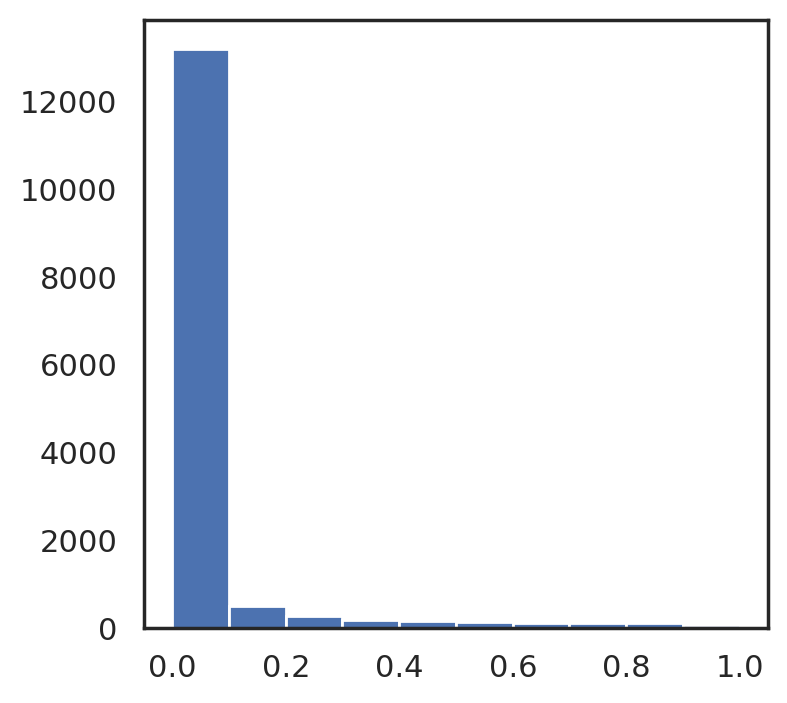

In [74]:
# Randomly sample numbers from a power law distribution where the shape of my df (i.e the number of cells that have been sequenced) is equal to the sum of that.
samples = _dfB.shape[0]
distribution = np.random.power(0.05, samples)
plt.hist(distribution)

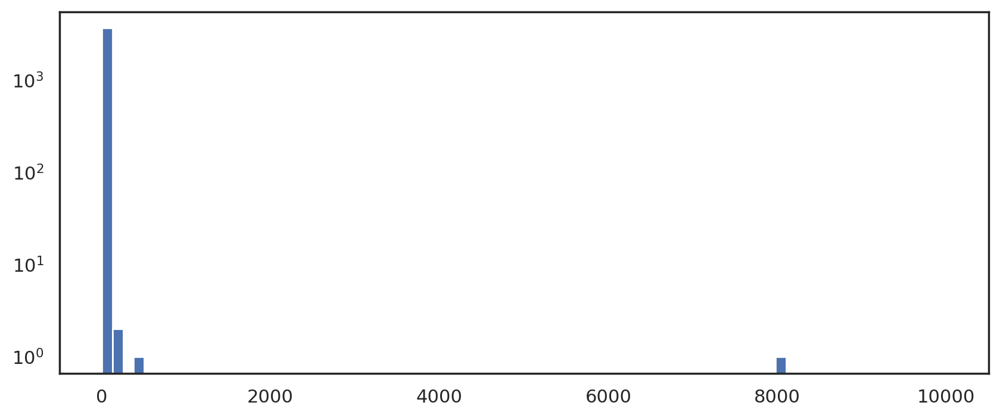

In [83]:
# Not necessary just rescales
x = pd.Series(distribution) * 100

# checking to see that binning does seem to give a discrete looking power distribution
fig, ax = plt.subplots(1,1, figsize = (10,4))
bins = np.linspace(0, 10000, 80)
plt.hist(np.round(x, decimals=3).value_counts(), bins = bins)
plt.yscale('log')

In [77]:
CloneSizeDist = np.round(x, decimals=4).value_counts()

In [78]:
CloneLabels = []
for CloneLabel, size in enumerate(CloneSizeDist):
    #print(CloneLabel, size)
    array = np.full(size, CloneLabel)
    CloneLabels.append(array)

In [79]:
clones = np.concatenate(CloneLabels)

In [80]:
np.random.shuffle(clones)

In [81]:
ClonesSim = pd.Series(clones)

In [82]:
ClonesSim.value_counts()

0       7187
1        372
2        184
3        129
4         94
        ... 
2444       1
4495       1
2452       1
4503       1
4090       1
Length: 4955, dtype: int64

In [29]:
_dfB.loc[:,'CLONE'] = ClonesSim.values

### Now I've got this CLONE column, what can I do with it: 
### Chi Squared Tests
For each tissue, we want a contingency table so we can get the ratio of observed amounts of Clones in each tissue to their expected distribution
I would compare the combined null distribution (e.g. combining all tissues) to the distribution in 
### Shannon Entropy 

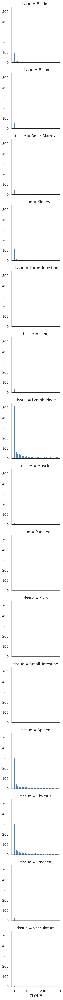

In [43]:
# We can plot the clone size distributions for each tissue
g = sns.FacetGrid(_dfB, row='tissue')
bins = np.linspace(0,300, 30)
g.map(plt.hist, "CLONE", color = "steelblue", bins = bins)

In [30]:
# codingdisciple.com/chi-squared-python.html
contingency_table_CLONE = pd.crosstab(_dfB['tissue'], _dfB['CLONE'], margins = True)

In [32]:
#contingency_table_Cluster = pd.crosstab(_dfB['tissue'], _dfB['leiden'], margins = True)

In [33]:
_dfB.replace('follicular B cell', 'B cell')

,10X_run,smartseq2_barcode,smartseq2_library_plate,smartseq2_sorting_direction,smartseq2_sort_order,smartseq2_cDNA_Plate,cell_id,method,notes,donor,smartseq2_sorted_population,10X_replicate,10X_sample,sequencer,sex,anatomical_position,tissue,smartseq2_well_seq,10X_barcode,n_counts,n_genes,batch,donor_tech_tissue,donor_tech,compartment,compartment_pred,propagated_cell_ontology_class,manual_cell_ontology_class,propagated_cell_ontology_class_0,manual_cell_ontology_class_0,CLONE
AACACACAGAGATGCC-1-1-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-1,TSP2_BM_vertebralbody_10X_1_1,nan,nan,nan,nan,nan,AACACACAGAGATGCC_TSP2_BM_vertebralbody_10X_1_1,10X,nan,TSP2,nan,1,1,novaseq,female,vertebralbody,Bone_Marrow,nan,AACACACAGAGATGCC,39216.0,3904,2,TSP2_10X_Bone_Marrow,TSP2_10X,unassigned,Immune,plasma cell,unassigned,plasma cell,unassigned,1270
AACAGGGCAGAAGCTG-1-1-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-1,TSP2_BM_vertebralbody_10X_1_1,nan,nan,nan,nan,nan,AACAGGGCAGAAGCTG_TSP2_BM_vertebralbody_10X_1_1,10X,nan,TSP2,nan,1,1,novaseq,female,vertebralbody,Bone_Marrow,nan,AACAGGGCAGAAGCTG,59937.0,4103,2,TSP2_10X_Bone_Marrow,TSP2_10X,unassigned,Immune,plasma cell,unassigned,plasma cell,unassigned,150
AACTTCTGTGCAACAG-1-1-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-1,TSP2_BM_vertebralbody_10X_1_1,nan,nan,nan,nan,nan,AACTTCTGTGCAACAG_TSP2_BM_vertebralbody_10X_1_1,10X,nan,TSP2,nan,1,1,novaseq,female,vertebralbody,Bone_Marrow,nan,AACTTCTGTGCAACAG,4257.0,1683,2,TSP2_10X_Bone_Marrow,TSP2_10X,unassigned,Immune,B cell,B cell,B cell,B cell,2464
AATCACGTCAACTACG-1-1-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-1,TSP2_BM_vertebralbody_10X_1_1,nan,nan,nan,nan,nan,AATCACGTCAACTACG_TSP2_BM_vertebralbody_10X_1_1,10X,nan,TSP2,nan,1,1,novaseq,female,vertebralbody,Bone_Marrow,nan,AATCACGTCAACTACG,64428.0,3718,2,TSP2_10X_Bone_Marrow,TSP2_10X,unassigned,Immune,plasma cell,unassigned,plasma cell,unassigned,1424
ACAAGCTCATCTTTCA-1-1-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-1,TSP2_BM_vertebralbody_10X_1_1,nan,nan,nan,nan,nan,ACAAGCTCATCTTTCA_TSP2_BM_vertebralbody_10X_1_1,10X,nan,TSP2,nan,1,1,novaseq,female,vertebralbody,Bone_Marrow,nan,ACAAGCTCATCTTTCA,3674.0,1587,2,TSP2_10X_Bone_Marrow,TSP2_10X,unassigned,Immune,B cell,B cell,B cell,B cell,679
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TSP2_Thymus_NA_SS2_B113695_B133049_Epithelial_P12_S84.homo.gencode.v30.ERCC.chrM-1-1,nan,nan,B133049,nan,nan,B113695,TSP2_Thymus_NA_SS2_B113695_B133049_Epithelial_...,smartseq2,nan,TSP2,Epithelial,nan,nan,novaseq,female,nan,Thymus,P12,nan,191551.0,1167,3,TSP2_smartseq2_Thymus,TSP2_smartseq2,unassigned,Immune,naive B cell,unassigned,medullary thymic epithelial cell,unassigned,8605
TSP2_Thymus_NA_SS2_B113695_B133049_Epithelial_P13_S85.homo.gencode.v30.ERCC.chrM-1-1,nan,nan,B133049,nan,nan,B113695,TSP2_Thymus_NA_SS2_B113695_B133049_Epithelial_...,smartseq2,nan,TSP2,Epithelial,nan,nan,novaseq,female,nan,Thymus,P13,nan,107278.0,1215,3,TSP2_smartseq2_Thymus,TSP2_smartseq2,unassigned,Immune,naive B cell,unassigned,medullary thymic epithelial cell,unassigned,90
TSP2_Thymus_NA_SS2_B113695_B133049_Epithelial_P7_S79.homo.gencode.v30.ERCC.chrM-1-1,nan,nan,B133049,nan,nan,B113695,TSP2_Thymus_NA_SS2_B113695_B133049_Epithelial_...,smartseq2,nan,TSP2,Epithelial,nan,nan,novaseq,female,nan,Thymus,P7,nan,353784.0,2801,3,TSP2_smartseq2_Thymus,TSP2_smartseq2,unassigned,Endothelial,plasma cell,unassigned,medullary thymic epithelial cell,unassigned,5459
TSP2_Thymus_NA_SS2_B113695_B133049_Epithelial_P9_S81.homo.gencode.v30.ERCC.chrM-1-1,nan,nan,B133049,nan,nan,B113695,TSP2_Thymus_NA_SS2_B113695_B133049_Epithelial_...,smartseq2,nan,TSP2,Epithelial,nan,nan,novaseq,female,nan,Thymus,P9,nan,1919445.0,3446,3,TSP2_smartseq2_Thymus,TSP2_smartseq2,unassigned,Immune,plasma cell,unassig

In [88]:
contingency_table_CellOntology = pd.crosstab(_dfB['tissue'], _dfB['propagated_cell_ontology_class'], margins = True)

In [84]:
contingency_table_CellOntology = pd.crosstab(_dfB['tissue'], _dfB['propagated_cell_ontology_class'])

In [89]:
contingency_table_CellOntology

propagated_cell_ontology_class,B cell,follicular B cell,memory B cell,naive B cell,plasma cell,pro-B cell,All
tissue,,,,,,,
Bladder,349,0,0,0,476,0,825
Blood,327,0,39,0,142,0,508
Bone_Marrow,0,218,0,0,299,0,517
Kidney,683,0,0,185,0,0,868
Large_Intestine,45,0,0,0,0,0,45
Lung,181,0,0,0,100,0,281
Lymph_Node,2418,0,521,1857,316,0,5112
Muscle,142,0,0,0,0,0,142
Small_Intestine,93,0,0,0,0,0,93


In [86]:
import scipy.stats as stats

In [87]:
stats.chi2_contingency(contingency_table_CellOntology)

(18528.234190667372,
 0.0,
 60,
 array([[3.16235127e+02, 1.21585992e+01, 7.50152109e+01, 2.81655625e+02,
         1.00670971e+02, 3.92644673e+01],
        [1.94724175e+02, 7.48674959e+00, 4.61911844e+01, 1.73431585e+02,
         6.19889129e+01, 2.41773932e+01],
        [1.98174013e+02, 7.61938886e+00, 4.70095322e+01, 1.76504191e+02,
         6.30871417e+01, 2.46057328e+01],
        [3.32717685e+02, 1.27923202e+01, 7.89250946e+01, 2.96335857e+02,
         1.05918064e+02, 4.13109789e+01],
        [1.72491888e+01, 6.63196322e-01, 4.09173878e+00, 1.53630341e+01,
         5.49114386e+00, 2.14169822e+00],
        [1.07711601e+02, 4.14129259e+00, 2.55506355e+01, 9.59336128e+01,
         3.42891428e+01, 1.33737155e+01],
        [1.95950784e+03, 7.53391022e+01, 4.64821525e+02, 1.74524067e+03,
         6.23793943e+02, 2.43296917e+02],
        [5.44307734e+01, 2.09275284e+00, 1.29117090e+01, 4.84789075e+01,
         1.73276095e+01, 6.75824770e+00],
        [3.56483234e+01, 1.37060573e+00, 8.45626

In [ ]:
f_obs = np.array([contingency_table_CellOntology.iloc[0][:-1].values, contingency_table.iloc[1][:-1].values, contingency_table.iloc[2][:-1].values])


# asymptomatic vs symptomatic
f_obs = f_obs[1:]
from scipy import stats

stats.chi2_contingency(f_obs)